<a href="https://colab.research.google.com/github/SisekoC/My-Notebooks/blob/main/Introduction_to_Diffusers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Diffusers

## Setup

In [1]:
!pip install -q -U diffusers
!pip install -q transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 48.2 MB/s eta 0:00:00


## Setting Seed

In [2]:
seed = 42

## Text-to-Image with Stable Diffusion Pipeline

### Stable Diffusion 1.5

In [3]:
import torch

from diffusers import StableDiffusionPipeline

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [4]:
# Set computation device.
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [5]:
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    use_safetensors=True,
    torch_dtype=torch.float16,
).to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:99: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


  0%|          | 0/150 [00:00<?, ?it/s]

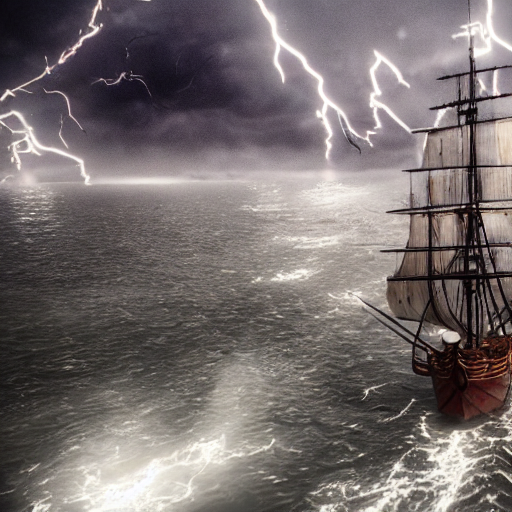

In [6]:
# Prompting to generate image.
prompt = "A photo of a large pirate ship sailing in the middle of a storm and lightning, highly detailed, unreal engine effect"
image = pipe(
    prompt, num_inference_steps=150, generator=torch.manual_seed(seed)
).images[0]

image

### Stable Diffusion 2.1

In [7]:
pipe = StableDiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1",
    torch_dtype=torch.float16,
    variant="fp16"
)

pipe = pipe.to(device)

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/681M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

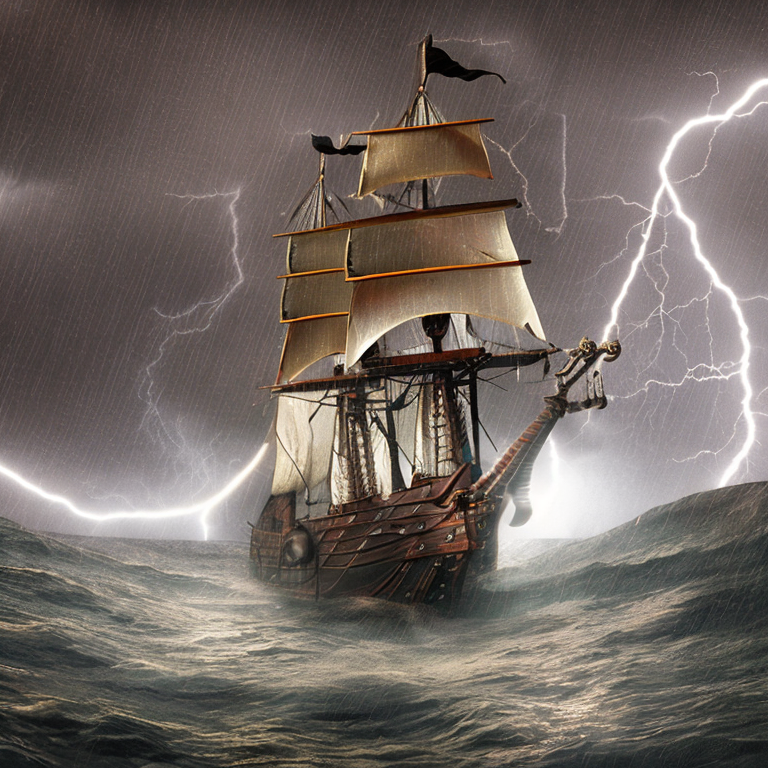

In [8]:
# prompt = "A mangrove forest during sunset, water color painting on canvas"
prompt = "A photo of a large pirate ship sailing in the middle of a storm and lightning, highly detailed, unreal engine effect"
image = pipe(
    prompt, num_inference_steps=150, generator=torch.manual_seed(seed)
).images[0]
image

#### Negative Prompt

  0%|          | 0/150 [00:00<?, ?it/s]

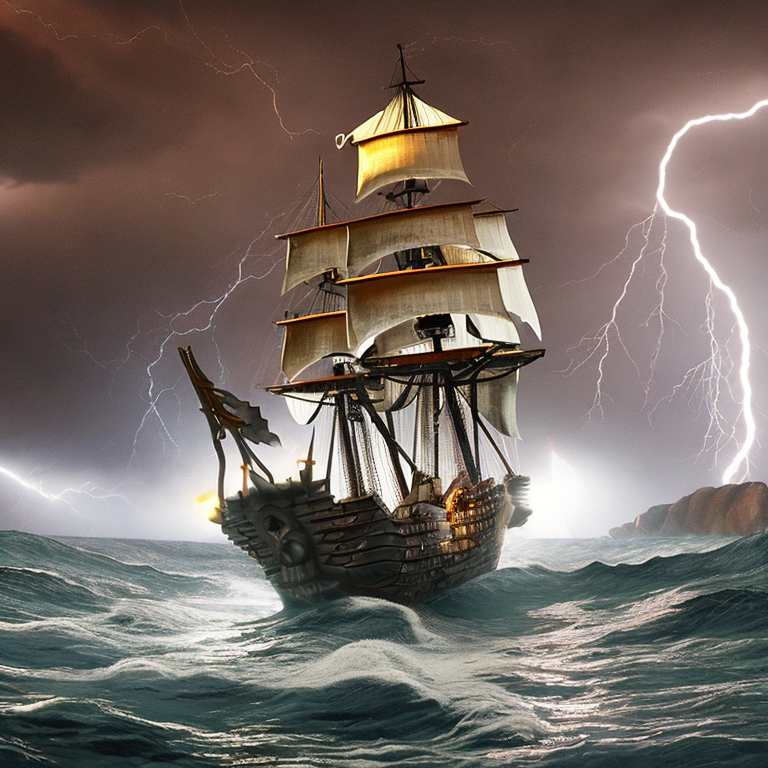

In [9]:
prompt = "A photo of a large pirate ship sailing in the middle of a storm and lightning, highly detailed, unreal engine effect"
image = pipe(
    prompt,
    num_inference_steps=150,
    generator=torch.manual_seed(seed),
    negative_prompt='low resolution, distorted, ugly, deformed, disfigured, poor details'
).images[0]
image

#### Swapping Schedulers

In [10]:
from diffusers import EulerAncestralDiscreteScheduler

In [11]:
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)

  0%|          | 0/150 [00:00<?, ?it/s]

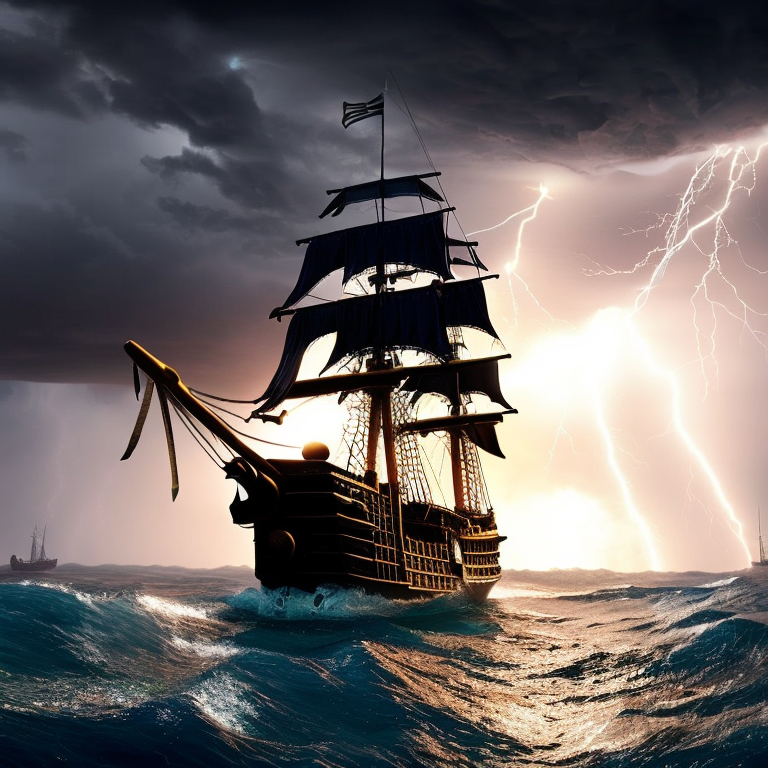

In [12]:
image = pipe(
    prompt,
    num_inference_steps=150,
    generator=torch.manual_seed(seed),
    negative_prompt='low resolution, distorted, ugly, deformed, disfigured, poor details'
).images[0]

image

## Stable Diffusion Image-to-Image Pipeline

In [13]:
import requests
import torch
from PIL import Image
from io import BytesIO

from diffusers import StableDiffusionImg2ImgPipeline

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

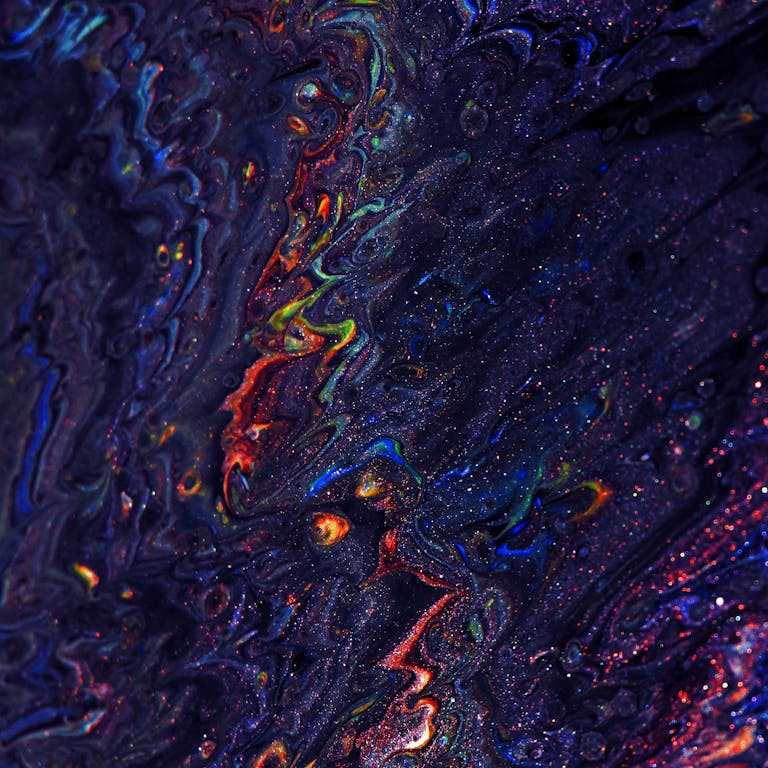

In [17]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    'stabilityai/stable-diffusion-2-1',
    torch_dtype=torch.float16
).to(device)

image_path = 'abstract_art_1.jpg'

init_image = Image.open(image_path).convert("RGB")
init_image = init_image.resize((768, 768))

init_image

  0%|          | 0/150 [00:00<?, ?it/s]

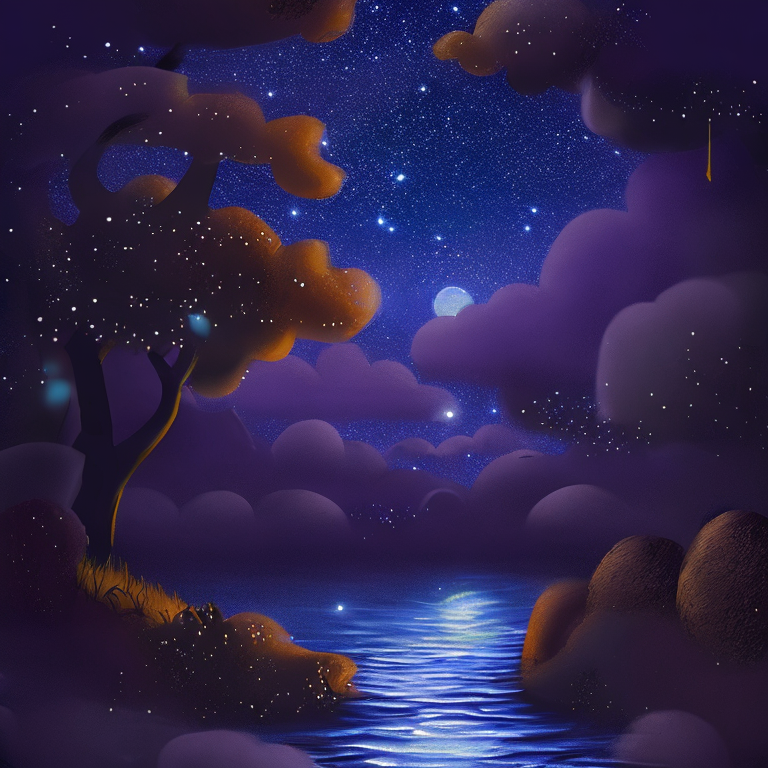

In [18]:
prompt = "A fantasy landscape, with starry night sky, moonlit river, trending on artstation"

image = pipe(
    prompt=prompt,
    image=init_image,
    num_inference_steps=150,
    strength=1,
    generator=torch.manual_seed(seed)
).images[0]

image

## Diffusers AutoPipeline

In [19]:
from diffusers import AutoPipelineForText2Image

In [20]:
pipe = AutoPipelineForText2Image.from_pretrained(
    'stabilityai/stable-diffusion-2-1',
    torch_dtype=torch.float16,
    use_safetensors=True
).to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

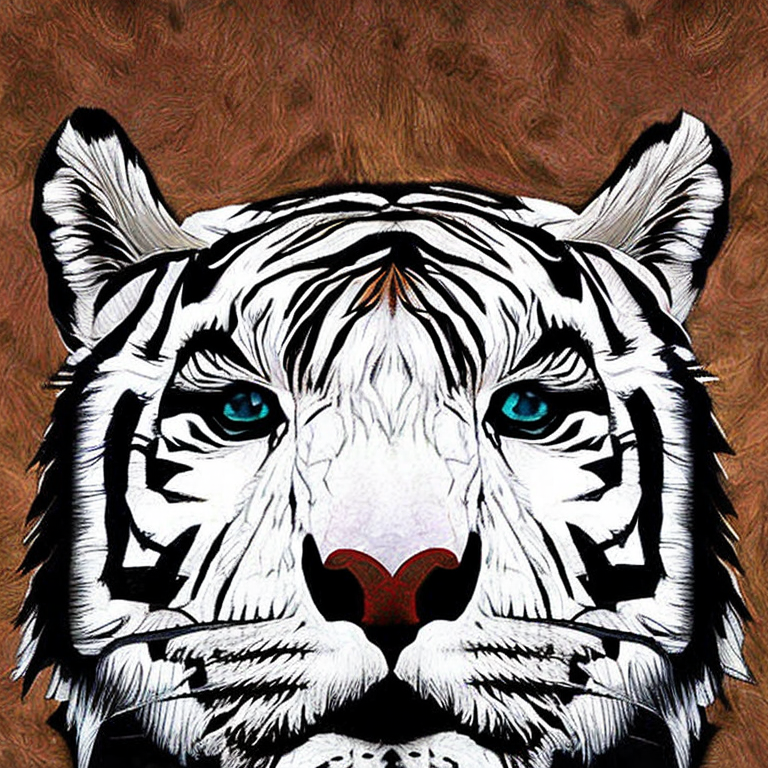

In [21]:
prompt = "A white tiger, anime style, realism, detailed line art, fine details, solid lines"

image = pipe(
    prompt,
    num_inference_steps=150,
    generator=torch.manual_seed(seed)
).images[0]

image

## AutoPipeline for Image-to-Image

In [22]:
from diffusers import AutoPipelineForImage2Image

In [23]:
pipe = AutoPipelineForImage2Image.from_pretrained(
    'stabilityai/stable-diffusion-2-1',
    torch_dtype=torch.float16,
    use_safetensors=True,
).to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

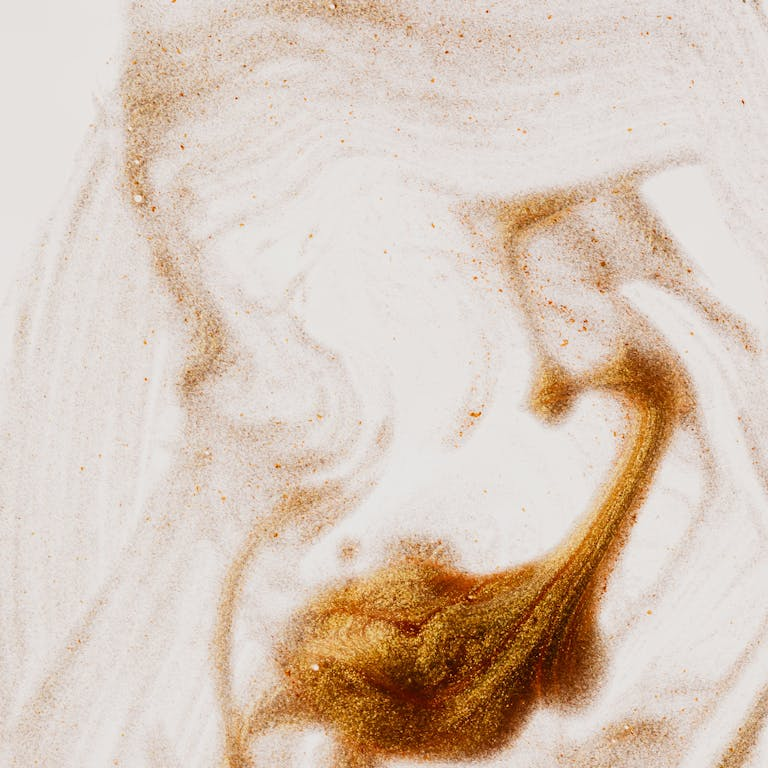

In [24]:
image_path = 'abstract_art_2.jpg'

init_image = Image.open(image_path).convert("RGB")
init_image

  0%|          | 0/150 [00:00<?, ?it/s]

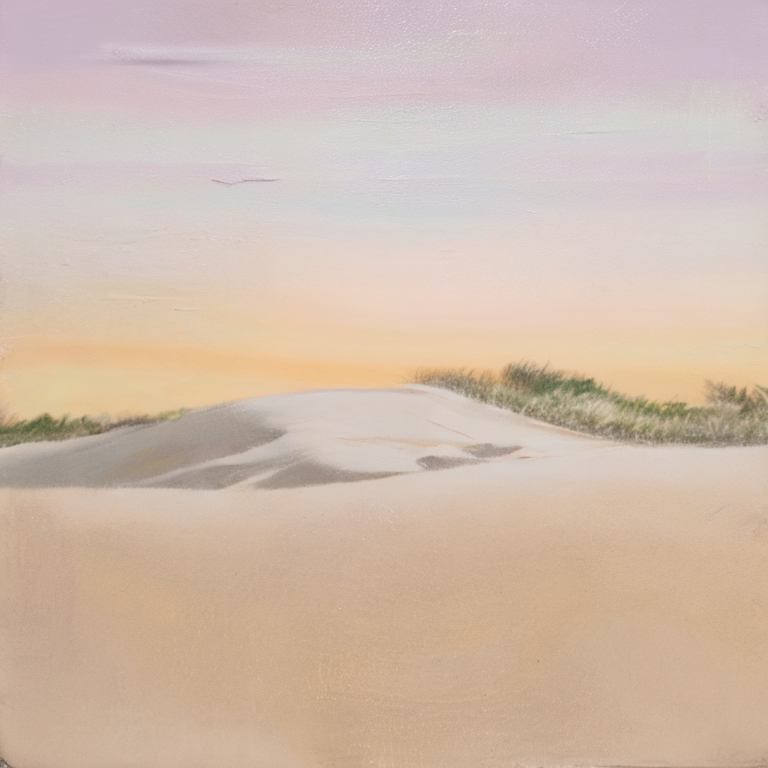

In [25]:
prompt = "a painting of sand dunes in a desert, with sun rising on the horizon, sand particle style, pastel drawing, on canvas"

image = pipe(
    prompt,
    init_image,
    num_inference_steps=150,
    strength=1.0,
    generator=torch.manual_seed(seed)
).images[0]

image

## AutoPipeline for Image InPainting

In [26]:
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image

In [27]:
pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_safetensors=True
).to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [28]:
img_url = "https://www.dropbox.com/scl/fi/oymummr3q4i86fbx79qv4/car.jpg?rlkey=8aogj5fwb0lrzd5u36rb3ifih&dl=1"
mask_url = "https://www.dropbox.com/scl/fi/le25tqopqapligom78myp/car_mask.png?rlkey=8t556dfxi1mr543j5fdwcg5mc&dl=1"

init_image = load_image(img_url).convert("RGB")
mask_image = load_image(mask_url).convert("RGB")

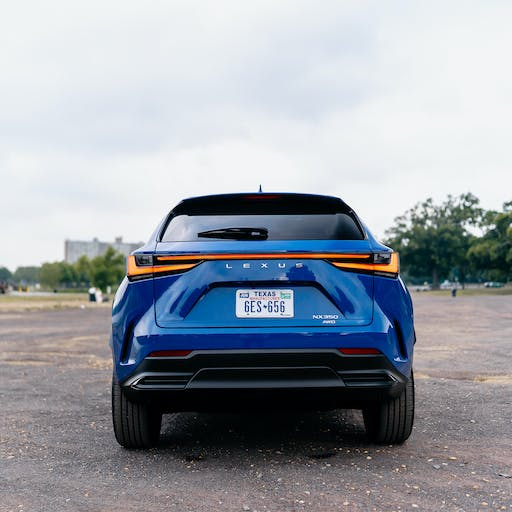

In [29]:
init_image

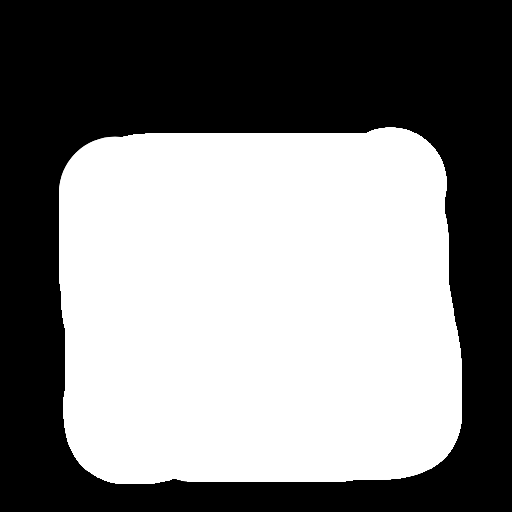

In [30]:
mask_image

  0%|          | 0/150 [00:00<?, ?it/s]

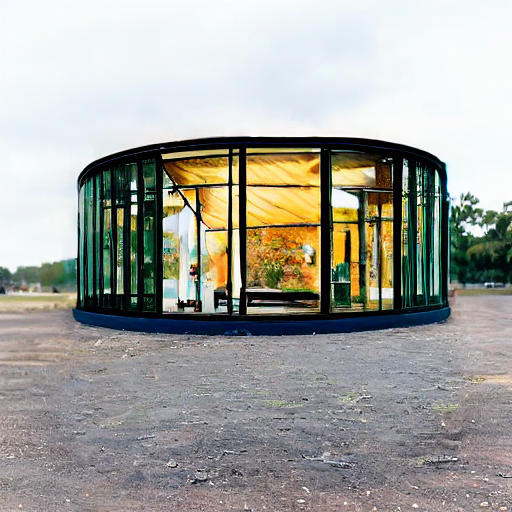

In [31]:
prompt = "A glass house in the middle of a ground"
image = pipeline(
    prompt,
    image=init_image,
    mask_image=mask_image,
    num_inference_steps=150,
    generator=torch.manual_seed(seed)
).images[0]

image